# Mosaic Generator Test Bench
## Michael A. Johnson
## For NASA Space Apps 2018

The goal of this exercise is to generate a tool to allow artists to make mosaic files using various NASA image assets. Allowing a broader range of uses for this information expands the audience for space imagery. 

This notebook goes through the process of taking an image and converting it to a mosaic using public domain photos scraped from images.nasa.gov.

The API description is:
* https://images.nasa.gov/docs/images.nasa.gov_api_docs.pdf

PIL Reference:
* http://effbot.org/imagingbook/image.htm

Some helpful Python mosaic information:
* https://github.com/codebox/mosaic
* http://blog.ryankelly.us/2017/01/02/image-mosaics-with-python.html
* https://github.com/charlienewey/image-mosaic

Generated on site at the Huntsville hackathon in the NASA Space and Rocket Center.

In [2]:
# Import the libraries I'll need
from PIL import Image
import requests
import json
import shutil
import numpy as np

download = False    # Download new images
makethumb = False   # Make new thumbnails

# Setup the working path's
base_dir  = '/Users/michael/Documents/SpaceApps/nasa_mosaic/'

tile_dir  = base_dir + 'Tiles/'
inputfile = base_dir + 'nasadude.jpg' # Input image to mosaic https://images.nasa.gov/details-s84-27017.html, cropped for demo print
final_path = base_dir + 'spacewalk3_mosaic.png'
search_terms  = ['earth%20observation', 'mars', 'jupiter'] # Image search term

max_to_get   = 200    # Don't get more than this number of images each search term
output_dpi   = 150   # DPI for the final image
output_w     = 24.0  # Width to rescale to in inches
tile_w       = 0.3   # Tile size in inches

In [3]:
# Get Thumbnails
max_per_page = 100

image_url_list = list()

for search_term in search_terms:
    api_url = 'https://images-api.nasa.gov/search?q=%s&media_type=image' % search_term

    # Initial search and number of results and page count
    response = requests.get(api_url)
    if response.status_code == 200:
        parsed_response = json.loads(response.content.decode('utf-8'))
        n_hits = parsed_response['collection']['metadata']['total_hits']
        # Limit to only max_to_get
        n_hits = min(n_hits, max_to_get)
        n_pages = int(n_hits/max_per_page)+int(n_hits%max_per_page>0)
        print("Found %d images (%d pages)" % (n_hits, n_pages))


    # Get the URL's for the thumbnails
    for k in range(n_pages):
        page_url = api_url+"&page=%d" % (k+1)
        response = requests.get(page_url)
        if response.status_code == 200:
            parsed_response = json.loads(response.content.decode('utf-8'))
        for item in parsed_response['collection']['items']:
            thumb_url = item['links'][0]['href']
            image_url_list.append(thumb_url)
    print(len(image_url_list))
    
    # Actually download the images
if download:
    for k in range(len(image_url_list)):
        if k % 50 == 0:
            print(k, 'of', len(image_url_list))
        response = requests.get(image_url_list[k])
        image_path = tile_dir + "image%d.jpg" % k
        if response.status_code == 200:
            with open(image_path, 'wb') as f:
                f.write(response.content)

Found 200 images (2 pages)
200
Found 200 images (2 pages)
400
Found 200 images (2 pages)
600


In [4]:
def pix_avg(s):
    weighted = np.sum(np.arange(len(s))*s)
    total = np.sum(s)
    return int(weighted / float(total))

#def pix_avg(s):
#    pmean = np.mean(s.astype(float))
#    return(int(pmean))

def average_color(img):
    h = img.histogram()

    r = np.array(h[0:256])
    g = np.array(h[256:512])
    b = np.array(h[512:768])
    
    return (pix_avg(r), pix_avg(g), pix_avg(b))

In [5]:
# Make a thumbnail and store mean color

colors = list()

tile_pix     = int(tile_w*output_dpi)

for k in range(n_hits):
    image_path = tile_dir + "image%d.jpg" % k
    out_path = tile_dir + "tile%d.jpg" % k
    img = Image.open(image_path) 
    min_pix = min(img.size)
    ci = img.crop( (0, 0, min_pix, min_pix) )
    ci.thumbnail((tile_pix,tile_pix), Image.ANTIALIAS)
    
    rgbimg = Image.new("RGB", ci.size)
    rgbimg.paste(ci)
    
    rgbimg.save(out_path, "JPEG")
    avg_color = average_color(rgbimg)
    colors.append((k,avg_color))

Input Size 7200 9000
7200 9000
Tiles 80 100


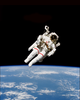

In [6]:
# Resize the input file so it can be mosaiced
mimg = Image.open(inputfile) 

print("Input Size", mimg.size[0], mimg.size[1])

ow, oh = mimg.size
print(ow,oh)
output_h = oh/ow*output_w
tiles_x       = int(output_w/tile_w)   # Number of tiles
tiles_y       = int(output_h/tile_w)   # Number of tiles

print("Tiles", tiles_x, tiles_y)

mimg = mimg.resize((tiles_x,tiles_y), Image.ANTIALIAS)

mimg

In [7]:
# Find the closest image in color
# Remove it once it was used
def find_closest_color(tgt_color, lcolors):
    cind = -1
    cdist = 1000
    for k in range(len(lcolors)):
        dist = np.sqrt(np.sum((np.array(lcolors[k][1])-tgt_color)**2))
        if dist < cdist:
            cdist = dist
            cind = k
    
    tilenum = lcolors[cind][0]
    del lcolors[cind]
    return(tilenum)


In [8]:
(w,h) = mimg.size


output_image = Image.new("RGBA", (tiles_x*tile_pix, tiles_y*tile_pix))

tcolors = colors.copy()

# Randowmize the order we search the image to reduce banding due to reuse
xlist = np.arange(w, dtype=int)
ylist = np.arange(h, dtype=int)
np.random.shuffle(xlist)
np.random.shuffle(ylist)
#xlist = xlist.astype(int)
#ylist = ylist.astype(int)


for xi in range(w):
    for yi in range(h):
        
        x = int(xlist[xi])
        
        y = int(ylist[yi])

        pixel = mimg.getpixel((x, y))
        box = (x*tile_pix,y*tile_pix,(x+1)*tile_pix,(y+1)*tile_pix)
        r = pixel[0]
        g = pixel[1]
        b = pixel[2]
        if len(pixel) < 4:
            a = 255
        else:
            a = pixel[3]
        if a > 0:
            tgt_color = np.array([r,g,b])
            tile_index = find_closest_color(tgt_color, tcolors)
            
            this_tile_path = tile_dir + "tile%d.jpg" % tile_index
            tile_img = Image.open(this_tile_path) 
            output_image.paste(tile_img, box)
        else:
            output_image.paste((0,0,0,a), box)
            
        # Allow us to use all the images again once we get low
        if len(tcolors) < ((max_to_get*3)/4):
            tcolors = colors.copy()

output_image.save(final_path, "PNG")

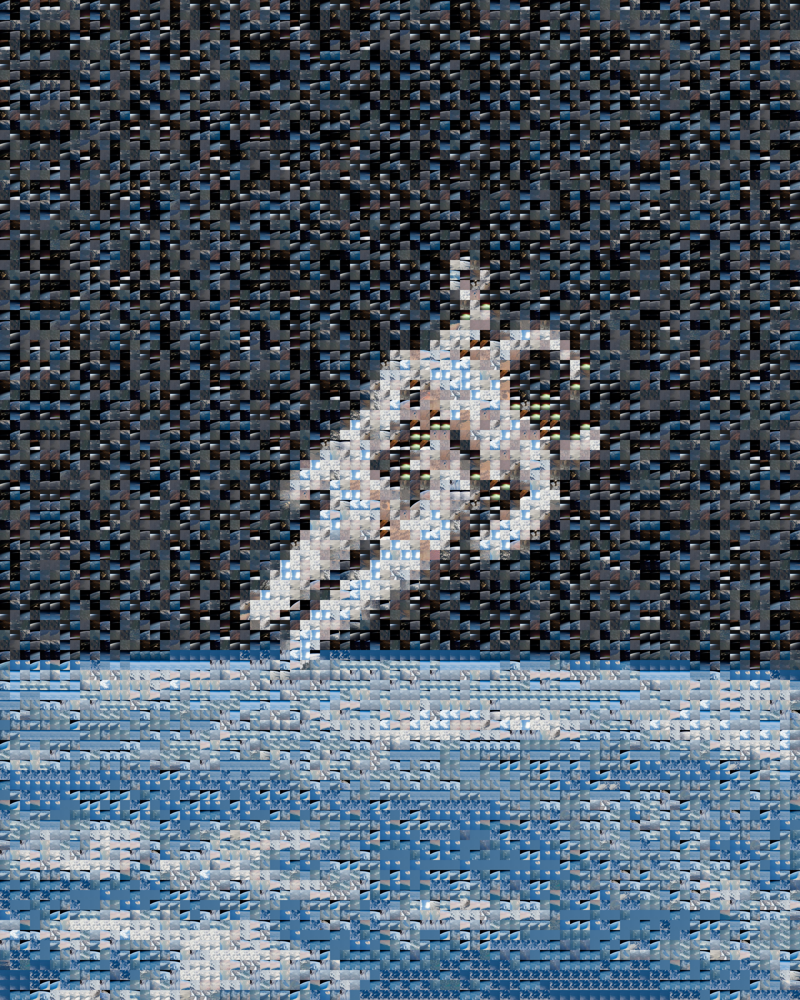

In [9]:
output_image